In [1]:
using QuantumDynamics
using Plots
using LinearAlgebra

Hoping to get rid of the units issue by integrating Unitful into QuantumDynamics package.

In [2]:
const thz2au = 0.0001519828500716
const invcm2au = 4.55633e-6
const au2fs = 0.02418884254
const mev2invcm = 8.066
const mev2au = mev2invcm * invcm2au
const nm2au = 18.897

18.897

In [3]:
N = 5

5

In [4]:
    H0 = Matrix{ComplexF64}([
        4.018 0.058 -0.086 0.168 0.000
        0.058 4.017 -0.168 0.086 0.000
        -0.086 -0.168 5.043 0.000 0.000
        0.168 0.086 0.000 5.042 0.000
        0.000 0.000 0.000 0.000 4.006 
    ]) * 1000 * mev2au

5×5 Matrix{ComplexF64}:
    0.147667+0.0im   0.00213158+0.0im  …  0.00617423+0.0im       0.0+0.0im
  0.00213158+0.0im      0.14763+0.0im     0.00316062+0.0im       0.0+0.0im
 -0.00316062+0.0im  -0.00617423+0.0im            0.0+0.0im       0.0+0.0im
  0.00617423+0.0im   0.00316062+0.0im         0.1853+0.0im       0.0+0.0im
         0.0+0.0im          0.0+0.0im            0.0+0.0im  0.147226+0.0im

In [5]:
show(stdout, "text/plain", real.(H0))

5×5 Matrix{Float64}:
  0.147667     0.00213158  -0.00316062  0.00617423  0.0
  0.00213158   0.14763     -0.00617423  0.00316062  0.0
 -0.00316062  -0.00617423   0.185337    0.0         0.0
  0.00617423   0.00316062   0.0         0.1853      0.0
  0.0          0.0          0.0         0.0         0.147226

In [6]:
cond(H0)

1.2913597299641004

In [7]:
eigvals(H0)

5-element Vector{Float64}:
 0.1452899769031642
 0.14722593926668
 0.14747754102447183
 0.18554545970580374
 0.1876216253401605

In [7]:
nsteps = 30000
ρ0 = Matrix{ComplexF64}(zeros(N, N))
ρ0[1, 1] = 1.0

T = 50.0:50.0:500.0

β = 1 / (T[6] * 3.16683e-6) # T = 300K

1052.5772881188234

Simulation is very sensitive to time-stepping. NaNs get produced if you're not careful

In [8]:
dt = 0.1/au2fs 

4.134137457575099

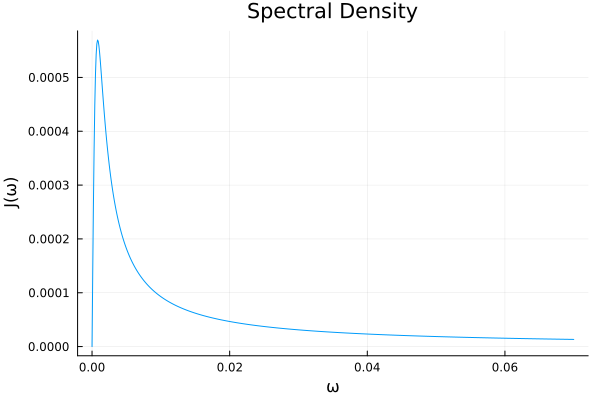

In [9]:
Jw2 = SpectralDensities.DrudeLorentz(λ=125*invcm2au, γ=180*invcm2au, Δs=1.0)
ω = 0:0.0001:0.07
ωs2, cs2 = SpectralDensities.discretize(Jw2, 100)
plot(ω, Jw2.(ω), xlabel="ω", ylabel="J(ω)", title="Spectral Density", legend=false)

In [ ]:
fbU = Propagators.calculate_bare_propagators(; Hamiltonian=H0, dt, ntimes=nsteps)
@time tquapi, ρquapi = QuAPI.propagate(; 
                                fbU=fbU, 
                                Jw=[Jw2],
                                β=β,
                                ρ0=ρ0,
                                dt,
                                ntimes=nsteps,
                                svec=[1.0 2.0 3.0 4.0 5.0],
                                kmax=3,
                                verbose=true)

[ Info: Starting propagation within memory
[ Info: Step = 1, #paths = 1
[ Info: Step = 2, #paths = 16
[ Info: Step = 3, #paths = 256
[ Info: Starting iteration
[ Info: Step = 4, #paths = 4096
[ Info: Step = 5, #paths = 65536
[ Info: Step = 6, #paths = 65536
[ Info: Step = 7, #paths = 65536
[ Info: Step = 8, #paths = 65536
[ Info: Step = 9, #paths = 65536
[ Info: Step = 10, #paths = 65536
[ Info: Step = 11, #paths = 65536
[ Info: Step = 12, #paths = 65536
[ Info: Step = 13, #paths = 65536
[ Info: Step = 14, #paths = 65536
[ Info: Step = 15, #paths = 65536
[ Info: Step = 16, #paths = 65536
[ Info: Step = 17, #paths = 65536
[ Info: Step = 18, #paths = 65536
[ Info: Step = 19, #paths = 65536
[ Info: Step = 20, #paths = 65536
[ Info: Step = 21, #paths = 65536
[ Info: Step = 22, #paths = 65536
[ Info: Step = 23, #paths = 65536
[ Info: Step = 24, #paths = 65536
[ Info: Step = 25, #paths = 65536
[ Info: Step = 26, #paths = 65536
[ Info: Step = 27, #paths = 65536
[ Info: Step = 28, #paths = 655

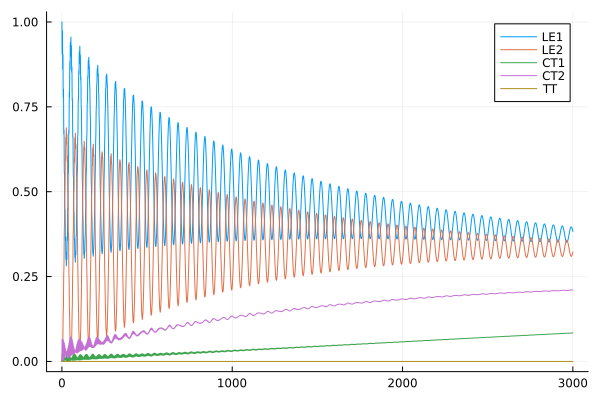

In [23]:
plot(tquapi.*au2fs, real.(ρquapi[:, 1, 1]), label="LE1")
plot!(tquapi.*au2fs, real.(ρquapi[:, 2, 2]), label="LE2")
plot!(tquapi.*au2fs, real.(ρquapi[:, 3, 3]), label="CT1")
plot!(tquapi.*au2fs, real.(ρquapi[:, 4, 4]), label="CT2")
plot!(tquapi.*au2fs, real.(ρquapi[:, 5, 5]), label="TT")

In [31]:
λs = repeat([150.0], 5) * mev2au
γs = repeat([180.0], 5) * mev2au
JwH = Vector{SpectralDensities.DrudeLorentz}()
sys_ops = Vector{Matrix{ComplexF64}}()
for (j, (λ, γ)) in enumerate(zip(λs, γs))
    push!(JwH, SpectralDensities.DrudeLorentz(; λ, γ, Δs=1.0))
    op = zeros(5, 5)
    op[j, j] = 1.0
    push!(sys_ops, op)
end


times_HEOM, ρs_HEOM = HEOM.propagate(;
                                    Hamiltonian=H0,
                                    ρ0,
                                    β,
                                    dt,
                                    ntimes=nsteps,
                                    Jw=JwH,
                                    sys_ops=sys_ops,
                                    num_modes=2,
                                    Lmax=3)

LoadError: InterruptException:

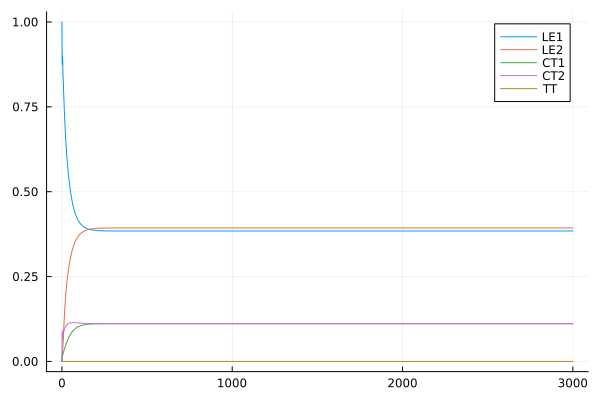

In [32]:
plot(times_HEOM.*au2fs, real.(ρs_HEOM[:, 1, 1]), label="LE1")
plot!(times_HEOM.*au2fs, real.(ρs_HEOM[:, 2, 2]), label="LE2")
plot!(times_HEOM.*au2fs, real.(ρs_HEOM[:, 3, 3]), label="CT1")
plot!(times_HEOM.*au2fs, real.(ρs_HEOM[:, 4, 4]), label="CT2")
plot!(times_HEOM.*au2fs, real.(ρs_HEOM[:, 5, 5]), label="TT")

In [26]:
times_BRME, ρs_BRME = BlochRedfield.propagate(;
                                            Hamiltonian=H0,
                                            Jw=JwH,
                                            β,
                                            ρ0,
                                            dt,
                                            ntimes=nsteps,
                                            sys_ops)

([0.0, 4.134137457575099, 8.268274915150197, 12.402412372725296, 16.536549830300395, 20.670687287875495, 24.804824745450595, 28.93896220302569, 33.07309966060079, 37.20723711817589  …  123986.91649013478, 123991.05062759235, 123995.18476504993, 123999.31890250751, 124003.45303996508, 124007.58717742265, 124011.72131488023, 124015.85545233781, 124019.98958979538, 124024.12372725295], [1.0000000000000002 + 0.0im -5.721291458939605e-17 + 0.0im … 9.88544890789825e-18 + 0.0im -0.0 + 0.0im; 0.9987675324756935 - 1.159992520591371e-18im -0.000511214066602568 - 0.008784364369293246im … -0.002027198907198352 - 0.025370855384153505im 0.0009457826272856149 + 2.1436076626818926e-6im; … ; 0.4250775849060961 + 1.3520635973841234e-18im -0.3544881190690332 - 1.6095300730811985e-10im … -0.03462559151999571 + 1.0803225801488451e-9im 3.534308966646759e-10 - 6.467610418132807e-11im; 0.42507758496237025 + 1.3617521762549019e-18im -0.35448811898878735 - 1.730843160032712e-10im … -0.034625591416113086 + 4.438

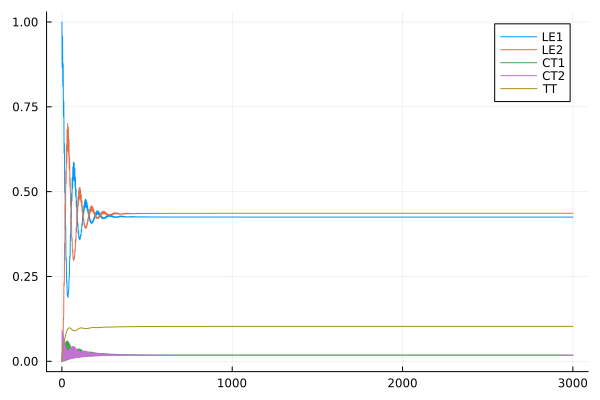

In [27]:
plot(times_BRME.*au2fs, real.(ρs_BRME[:, 1, 1]), label="LE1")
plot!(times_BRME.*au2fs, real.(ρs_BRME[:, 2, 2]), label="LE2")
plot!(times_BRME.*au2fs, real.(ρs_BRME[:, 3, 3]), label="CT1")
plot!(times_BRME.*au2fs, real.(ρs_BRME[:, 4, 4]), label="CT2")
plot!(times_BRME.*au2fs, real.(ρs_BRME[:, 5, 5]), label="TT")

In [16]:
Jw = SpectralDensities.DrudeLorentz(λ=150*mev2au, γ=180*mev2au, Δs=1.0)
fbU = Propagators.calculate_bare_propagators(; Hamiltonian=H0, dt=dt, ntimes=nsteps)
@time t_TTM, ρ_TTM = TTM.propagate(; fbU=fbU,
                            Jw=[Jw],
                            β=β,
                            ρ0=ρ0,
                            dt=dt,
                            ntimes=10000,
                            rmax=10,
                            svec=[1.0 2.0 3.0 4.0 5.0],
                            extraargs=TEMPO.TEMPOArgs(),
                            path_integral_routine=TEMPO.build_augmented_propagator)

 10.800317 seconds (3.91 M allocations: 14.675 GiB, 16.95% gc time)


(0.0:4.134137457575099:41341.37457575099, ComplexF64[1.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; 0.9991022038032183 - 4.3869608854093116e-20im -0.0006273741215740763 - 0.008770054677979063im … -0.00626324298808561 - 0.024640749222285364im 0.0 + 0.0im; … ; 1.1373763220503776 - 3.3783412192583554e-11im -0.10680479196150582 - 0.006041786308763394im … -0.09361159073637663 - 0.0021747108924642282im 1.2458297971808502e-14 + 2.4698628071156105e-14im; 1.1373704258368627 - 3.378767521491125e-11im -0.10680336803037219 - 0.0060416427828880225im … -0.09361116456757494 - 0.0021747071463543485im 1.2458309360223266e-14 + 2.4698551342747167e-14im;;; 0.0 + 0.0im 0.0 + 0.0im … 0.0 + 0.0im 0.0 + 0.0im; -0.0006273741215740707 + 0.008770054677979065im 7.741740851870929e-5 - 6.776263578034403e-20im … 0.00022057367499825573 - 3.956752144407454e-5im 0.0 + 0.0im; … ; -0.10680479196122299 + 0.00604178631390602im 0.36487865074705833 - 1.5520820680475307e-11im … -0.024211537352888647 - 0.001616529449391230

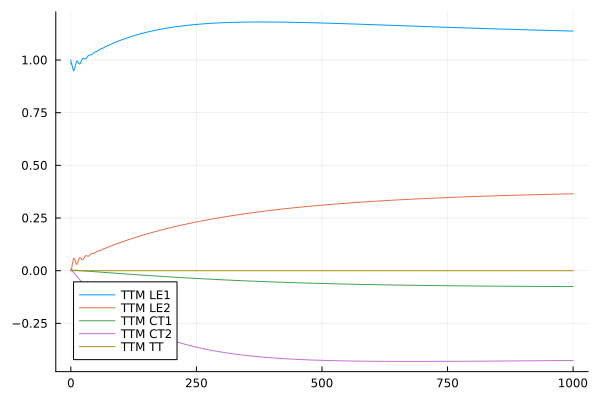

In [17]:
plot(t_TTM.*au2fs, real.(ρ_TTM[:,1,1]), label="TTM LE1")
plot!(t_TTM.*au2fs, real.(ρ_TTM[:,2,2]), label="TTM LE2")
plot!(t_TTM.*au2fs, real.(ρ_TTM[:,3,3]), label="TTM CT1")
plot!(t_TTM.*au2fs, real.(ρ_TTM[:,4,4]), label="TTM CT2")
plot!(t_TTM.*au2fs, real.(ρ_TTM[:,5,5]), label="TTM TT")